# Validation of Zambia Model.
The notebooks in this document examines the outcomes generated by the PyPSA-Earth model concerning the Zambia case. Specifically, it compares publicly available data related to Zambia's power system with the information used and derived from the PyPSA-Earth model.

The following quantities will be reviewed:
 - inputs used by the pypsa-model:
    - network characteristics.
    - substations.
    - installed generation by type.
 - outputs of the simulation
   - demand.
   - installed capacity.
## Preparation 


In [1]:
import os
import sys
import logging
import os

import pypsa
import yaml
import pandas as pd
import geopandas as gpd
import numpy as np
import scipy as sp
import networkx as nx
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.io.img_tiles import OSM
import cartopy.feature as cfeature
from scipy.sparse import csgraph
from itertools import product
import re

from shapely.geometry import Point, LineString
import shapely, shapely.prepared
from shapely.wkt import loads
from shapely.validation import make_valid

logger = logging.getLogger(__name__)

pd.set_option("display.max_columns", None)
pd.set_option("display.max_colwidth", 70)


Cannot find header.dxf (GDAL_DATA is not defined)
c:\Users\user\Miniconda3\envs\pypsa-earth\lib\site-packages\pypsa\networkclustering.py:16: UserWarning: The namespace `pypsa.networkclustering` is deprecated and will be removed in PyPSA v0.24. Please use `pypsa.clustering.spatial instead`. 
  warnings.warn(


In [2]:
import country_converter as coco


In [3]:
def three_2_two_digits_country(three_code_country):
    """
    Convert 3-digit to 2-digit country code:

    Parameters
    ----------
    three_code_country: str
        3-digit country name

    Returns
    ----------
    two_code_country: str
        2-digit country name
    """
    if three_code_country == "SEN-GMB":
        return f"{three_2_two_digits_country('SN')}-{three_2_two_digits_country('GM')}"

    two_code_country = coco.convert(three_code_country, to="ISO2")
    return two_code_country

In [4]:
def two_digits_2_name_country(two_code_country, nocomma=False, remove_start_words=[]):
    """
    Convert 2-digit country code to full name country:

    Parameters
    ----------
    two_code_country: str
        2-digit country name
    nocomma: bool (optional, default False)
        When true, country names with comma are extended to remove the comma.
        Example CD -> Congo, The Democratic Republic of -> The Democratic Republic of Congo
    remove_start_words: list (optional, default empty)
        When a sentence starts with any of the provided words, the beginning is removed.
        e.g. The Democratic Republic of Congo -> Democratic Republic of Congo (remove_start_words=["The"])

    Returns
    ----------
    full_name: str
        full country name
    """
    if two_code_country == "SN-GM":
        return f"{two_digits_2_name_country('SN')}-{two_digits_2_name_country('GM')}"

    full_name = coco.convert(two_code_country, to="name_short")

    if nocomma:
        # separate list by delim
        splits = full_name.split(", ")

        # reverse the order
        splits.reverse()

        # return the merged string
        full_name = " ".join(splits)

    # when list is non empty
    if remove_start_words:
        # loop over every provided word
        for word in remove_start_words:
            # when the full_name starts with the desired word, then remove it
            if full_name.startswith(word):
                full_name = full_name.replace(word, "", 1)

    return full_name


In [5]:
def country_name_2_two_digits(country_name):
    """
    Convert full country name to 2-digit country code.

    Parameters
    ----------
    country_name: str
        country name

    Returns
    ----------
    two_code_country: str
        2-digit country name
    """
    if (
        country_name
        == f"{two_digits_2_name_country('SN')}-{two_digits_2_name_country('GM')}"
    ):
        return "SN-GM"

    full_name = coco.convert(country_name, to="ISO2")
    return full_name


NA_VALUES = ["NULL", "", "N/A", "NAN", "NaN", "nan", "Nan", "n/a", "na", "null"]


## Definition of main folder paths

In [6]:
import os

scenario_name = ""  # scenario name, default value is "" for tutorial or default configuration
                    # value shall be non null if a scenario name is specified under the "run" tag in the config file

scenario_subpath = scenario_name + "/" if scenario_name else ""

# OSM raw data files
substations_OSMraw_path = (
    os.getcwd() + "/resources/" + scenario_subpath + "osm/raw/all_raw_substations.geojson"
)
lines_OSMraw_path = os.getcwd() + "/resources/" + scenario_subpath + "osm/raw/all_raw_lines.geojson"

# cleaned osm data files
substations_OSMclean_path = (
    os.getcwd() + "/resources/" + scenario_subpath + "osm/clean/all_clean_substations.geojson"
)
lines_OSMclean_path = os.getcwd() + "/resources/" + scenario_subpath + "osm/clean/all_clean_lines.geojson"

# shapes files
countries_shape_path = os.getcwd() + "/resources/" + scenario_subpath + "shapes/country_shapes.geojson"

# solve network output
solved_network_path = os.getcwd() + "/results/" + scenario_subpath + "networks/elec_s_10_ec_lcopt_Co2L-12H.nc"

## 1. Analysis of the Zambian Transmission Network
In this specific section, a comparison is made regarding the publicly available data related to the network power system. The primary focus of this comparison lies in evaluating various aspects of the data, with special attention given to the main parameters being analyzed.

- Layout of the network as shown by images (Section 1.1)
- Total length of the line (Section 1.2)

The data utilized for the comparison has been sourced from reliable public sources. The primary sources of this data include the [National Grid SLD 1_03_2022 Rev 8-Model (1)](https://drive.google.com/file/d/1UT5-A4BparyIv5Ye0olZep6f0yKL2-Rp/view?usp=sharing), [ZESCO GRID 66 - 330KV with Generation Projects rev0-Model 18052022 (3)](https://drive.google.com/file/d/1VF8Zo2e1010wZnRvjuTIeekKnDCfjrt6/view?usp=sharing), and Fibercom, which is a subsidiary of Zesco.

In the Section 1.1, the network layout obtained by the workflow is drawn to be possibly compared with the image as shown below.The image shown below was obtained from fibercom , which is a subsidiary of zesco.

In the Section 1.2, the network length as obtained from the workflow is calculated to then be compared with the information reported by [National Grid SLD 1_03_2022 Rev 8-Model (1)](https://drive.google.com/file/d/1UT5-A4BparyIv5Ye0olZep6f0yKL2-Rp/view?usp=sharing).

The image below depicts the national power grid of Zambia.


![fibre_com Zesco_transmission_network.](<attachment:fibre_com Zesco_transmission_network.png>)

In the Section 1.2, the network length as obtained from the workflow is calculated to then be compared with the information reported by [National Grid SLD 1_03_2022 Rev 8-Model (1)](https://drive.google.com/file/d/1UT5-A4BparyIv5Ye0olZep6f0yKL2-Rp/view?usp=sharing). According to the data available, in Zambia, there are:

- \> 10,887.40km lines
This information shall be close to one  obtained by the workflow.


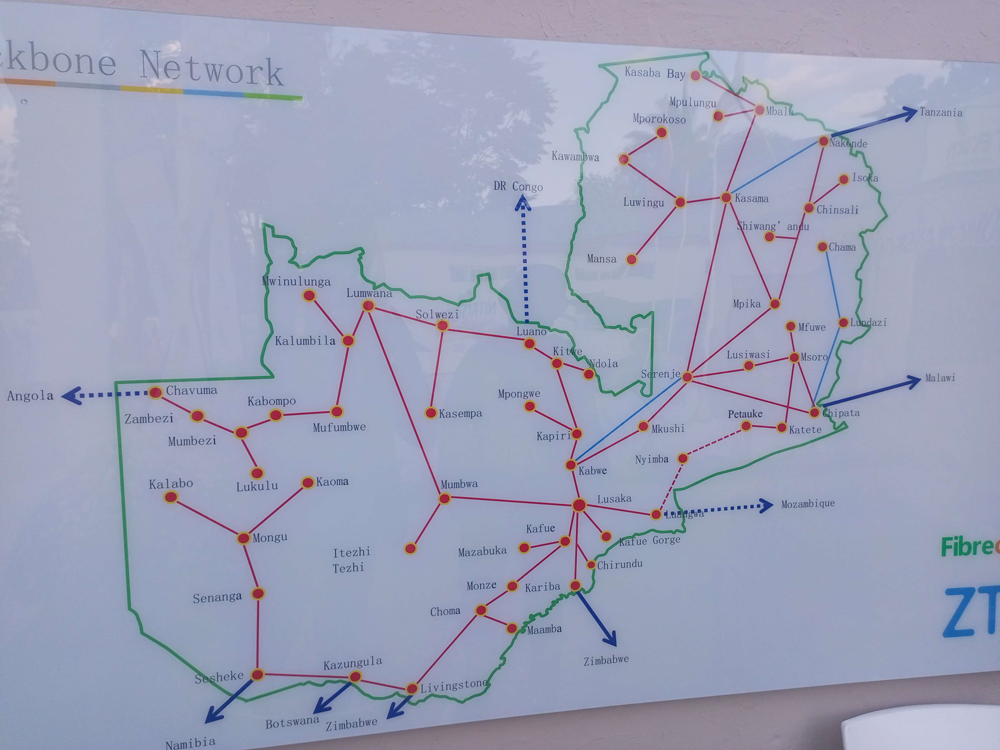

### 1.1. Network layout (using OSM clean data)
In this section, the cleaned OSM data is to draw plots of the entire network, to reproduce the images available from [ZESCO GRID 66 - 330KV with Generation Projects rev0-Model 18052022 (3)](https://drive.google.com/file/d/1VF8Zo2e1010wZnRvjuTIeekKnDCfjrt6/view?usp=sharing) and the fibercom transmission network to verify the quality of the pypsa-earth model.

#### 1.1.1. Load clean OSM data


In [7]:
# load substation geodataframe
df_substations_osm_clean = gpd.read_file(
    substations_OSMclean_path
)  # .to_crs(epsg=3857)
# df_substations_osm_clean = df_substations_osm_clean[
#     df_substations_osm_clean.country == "ZM"
# ]
df_substations_osm_clean["geometry"] = df_substations_osm_clean["geometry"].apply(
    make_valid
)
# load lines geodataframe
df_lines_osm_clean = gpd.read_file(lines_OSMclean_path)  # .to_crs(epsg=3857)
# df_lines_osm_clean = df_lines_osm_clean[df_lines_osm_clean.country == "NG"]
df_lines_osm_clean["geometry"] = df_lines_osm_clean["geometry"].apply(make_valid)

#### 1.1.2. Calculating the voltage levels for substations and lines
Substations voltage level [V]

In [8]:
voltage_substations = df_substations_osm_clean.voltage.unique()
voltage_substations.sort()
voltage_substations

array([ 66000,  88000, 132000, 220000, 330000], dtype=int64)

Lines voltage level [V]

In [9]:
unique_voltages = df_lines_osm_clean.voltage.unique()
unique_voltages.sort()
unique_voltages

array([ 66000,  88000, 132000, 220000, 330000], dtype=int64)

#### 1.1.3. Specifying colors for voltage levels 
Specify color array by voltage level

In [10]:
color_voltages = ["orange", "blue", "red","Purple","brown"]

voltage_to_color = {v: c for (v, c) in zip(unique_voltages, color_voltages)}
voltage_to_color

{66000: 'orange',
 88000: 'blue',
 132000: 'red',
 220000: 'Purple',
 330000: 'brown'}

#### 1.1.4. Plotting the network data
Getting the borders of the country shape to perform the desired plot

In [11]:
# get all country shapes
country_shapes = gpd.read_file(countries_shape_path)

# get zambia shape
df_geometry = country_shapes.set_index("name").geometry

# get bounds
# print("Original bounds:")
# print(df_geometry.boundary.bounds)

# add tolerance to bounds
tol = 0.2

bounds_mod = df_geometry.boundary.bounds
bounds_mod["minx"] -= tol  # reduce minx
bounds_mod["miny"] -= tol  # reduce miny
bounds_mod["maxx"] += tol  # increase maxx
bounds_mod["maxy"] += tol  # increase maxy

print("Modified bounds:")
print(bounds_mod)

# reorder bounds to comply with extend function (x0, x1, y0, y1)
extent_list = list(bounds_mod[["minx", "maxx", "miny", "maxy"]].loc["ZM"])

Modified bounds:
           minx       miny       maxx      maxy
name                                           
ZM    21.780038 -18.279176  33.912438 -8.072976


Drawing the picture using pyplot we get

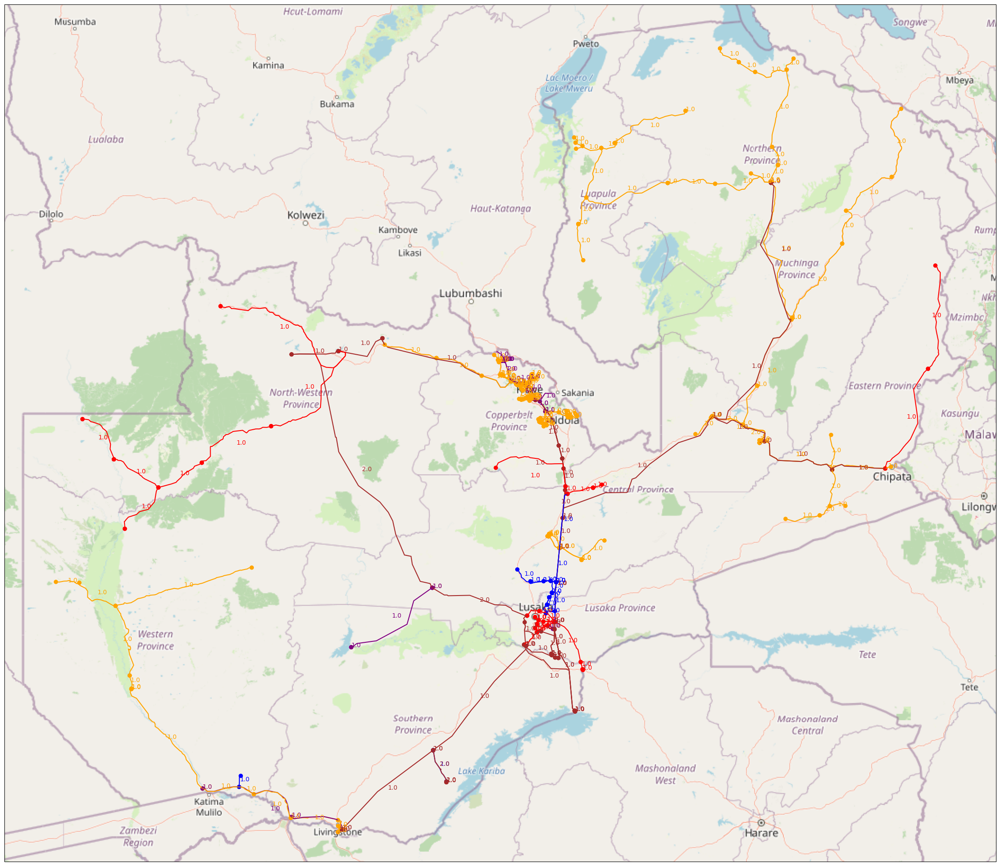

In [12]:
%matplotlib inline

# get the structure of the background data to plot
imagery = OSM()

max_width = 30  # max width of the figure
max_height = 30  # max heifht of the figure

# calculate figure size with appropriate multiplier to adhere to the desired width/height
multiplier = min(
    max_width / (extent_list[1] - extent_list[0]),
    max_height / (extent_list[3] - extent_list[2]),
)
figsize = (
    (extent_list[1] - extent_list[0]) * multiplier,
    (extent_list[3] - extent_list[2]) * multiplier,
)


fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(1, 1, 1, projection=imagery.crs)  # specify projection
ax.set_extent(extent_list, ccrs.PlateCarree())  # specify the location of the image
ax.add_image(imagery, 7)  # add the background image

# create an auxiliary dataframe for the substations with the desired crs and color properties
df_substations_osm_clean_plot = df_substations_osm_clean.to_crs(imagery.crs)
# specify the color of the nodes
df_substations_osm_clean_plot["color"] = df_substations_osm_clean_plot.voltage.apply(
    lambda x: voltage_to_color[x]
)

# create an auxiliary dataframe for the lines with the desired crs and properties
df_lines_osm_clean_plot = df_lines_osm_clean.to_crs(imagery.crs)
df_lines_osm_clean_plot[
    "centroids"
] = df_lines_osm_clean_plot.geometry.boundary.centroid  # get the centroids of the line
df_lines_osm_clean_plot["color"] = df_lines_osm_clean_plot.voltage.apply(
    lambda x: voltage_to_color[x]
)  # specify the color of the line

# draw the substations
df_substations_osm_clean_plot.plot(color=df_substations_osm_clean_plot.color, ax=ax)

# draw the lines
df_lines_osm_clean_plot.plot(color=df_lines_osm_clean_plot.color, ax=ax)

# add annotations to show the number of circuits by line
for (id, row) in df_lines_osm_clean_plot.iterrows():
    ax.text(row.centroids.x, row.centroids.y, row.circuits, color=row.color)

#### 1.1.5. Comments on the network layout
Upon comparing the image of the existing lines provided by Fibercom and [ZESCO GRID 66 - 330KV with Generation Projects rev0-Model 18052022 (3)](https://drive.google.com/file/d/1VF8Zo2e1010wZnRvjuTIeekKnDCfjrt6/view?usp=sharing) with the plots generated through the workflow, it becomes evident that there is a substantial overlap between them, revealing only negligible differences.

### 1.2. Calculate the total length of the lines
In this part, we calculate the overall length of the lines. To achieve this, we take the following steps:
1. Loading initial data
2. Verify units are in meters
3. Check the circuit count for each line in the raw OSM data.
4. Calculate the combined length of lines in the raw OSM data.
5. calculate the total length of lines in the cleaned  OSM data.

#### 1.2.1  Preliminary data loading of raw OSM data
In the following, we show the input data downloaded from OSM; the clean data have already been loaded.



In [13]:
# load substation geodataframe
df_substations_osm_raw = gpd.read_file(substations_OSMraw_path)
# df_substations_osm_raw = df_substations_osm_raw[df_substations_osm_raw.Country == "NG"]
# load lines geodataframe
df_lines_osm_raw = gpd.read_file(lines_OSMraw_path)
# df_lines_osm_raw = df_lines_osm_raw[df_lines_osm_raw.Country == "NG"]

# note that epsg=3857 has been chosen so that lenghts are in meters

#### 1.2.2 Crosscheck the unit of measurement
Next, we check if the property `geometry.length` works correctly for measuring line length in meters (which it does). To do this, we use the coordinate reference system (CRS) EPSG:3763 and compare the result with the "Length" column in the raw OSM data of the `df_lines_osm_raw` dataframe.

In [14]:
df_lines_osm_raw["length_by_geometry"] = df_lines_osm_raw.to_crs(
    epsg=3857
).geometry.length
df_lines_osm_raw[["Length", "length_by_geometry"]].head()


,Length,length_by_geometry
0,24.984746,24.984746
1,22274.172689,22274.172689
2,6679.609432,6679.609432
3,31599.256336,31599.256336
4,35221.506281,35221.506281


#### 1.2.3. Verify the value of column tags.cables
Next, we display the values in the "tags.cables" column of the dataframe. This helps validate and check the accuracy of the method we used to estimate the total length. This column indicates the number of cables per geometric line, which is an essential detail for calculating the total length of lines managed by each Zesco operator. This is particularly important because a single geometric path can accommodate multiple circuits, and since three-phase lines are common, each circuit consists of three cables.
Specifically, we demonstrate that the available values are either integers or "None." As a convention, we will replace the "None" values with 3, which serves as the base-case scenario.

In [15]:
df_lines_osm_raw["tags.cables"].unique()

array(['3', nan, '6'], dtype=object)

#### 1.2.4. Calculate the total line length for OSM raw data
In this scenario, we compute the total length of the lines.

we display line lengths based on voltage levels in kilometers (km).

Note: When multiple circuits are present, the line length is adjusted accordingly.

In [16]:
# Note, since CRS EPSG:3763 is used, distances are in meters, thus by dividing for 1000, the units are in km
df_lines_osm_raw["cables_fix"] = df_lines_osm_raw["tags.cables"].copy()
df_lines_osm_raw.loc[
    df_lines_osm_raw["tags.cables"].isnull() | df_lines_osm_raw["tags.cables"].isna(),
    "cables_fix",
] = 3  # when NaN or None, set default value
df_lines_osm_raw["length"] = (
    df_lines_osm_raw.to_crs(epsg=3857).geometry.length
    * df_lines_osm_raw["cables_fix"].astype(float)
    / 3
)
df_lines_osm_raw.groupby(by=["tags.voltage"]).length.sum() / 1000

tags.voltage
120000                     8.859070
132000                  1682.267285
220000                  1028.606256
33000                    353.138414
330000                  4997.338686
6600                       0.120239
66000                   4685.875062
88000                    413.983972
Avenida La Esperanza       2.287838
Name: length, dtype: float64

Total lines length [km]

In [17]:
df_lines_osm_raw.to_crs(epsg=3857).length.sum() / 1000

13221.271726916608

Furthermore, for the purpose of clarity, it is also shown the total length of the line where information on the number of circuits has been fixed (length of the lines where the cables data where missing)

Show total line length [km] for lines where information on the number of circuits is not available.

In [18]:
# Note, since CRS EPSG:3763 is used, distances are in meters, thus by dividing for 1000, the units are in km
df_lines_osm_raw.to_crs(epsg=3857)[
    df_lines_osm_raw["tags.cables"].isnull()
    | df_lines_osm_raw["tags.cables"].isna()  # when NaN or None, set default value
].geometry.length.sum() / 1000

5650.181016515987

#### 1.2.5 Calculate the total line length for OSM clean data
Finally, the information on total line length for the clean dataset are calculated.

Show line length by voltage level [km]

Note: when multiple circuits are available, the length of the line is multiplied accordingly.

In [19]:
# Note, since CRS EPSG:3763 is used, distances are in meters, thus by dividing for 1000, the units are in km
df_lines_osm_clean["length"] = (
    df_lines_osm_clean.to_crs(epsg=3857).geometry.length
    * df_lines_osm_clean.circuits
    / 1000
)
df_lines_osm_clean.groupby(by=["voltage"]).length.sum()

voltage
66000     4560.521078
88000      413.983972
132000    1682.267285
220000     704.914506
330000    4997.338686
Name: length, dtype: float64

Total lines length [km]

In [20]:
df_lines_osm_clean.to_crs(epsg=3857).length.sum() / 1000

11624.717297776438

In [21]:
df_lines_osm_clean["length"] = (
    df_lines_osm_clean.to_crs(epsg=3857).geometry.length
    * df_lines_osm_clean.circuits
    / 1000
)
df_lines_osm_clean.groupby(by=["voltage"]).length.sum()

voltage
66000     4560.521078
88000      413.983972
132000    1682.267285
220000     704.914506
330000    4997.338686
Name: length, dtype: float64

#### 1.2.6. Remarks on the line length
Based on the available data from the Zambia Electricity Supply Corporation(ZESCO), zambia's network includes:

- 10,887.40 km of lines


The current cleaning of OSM data captures approximately 106.8% (11624/10,887.40) of the network length. This value is quite close to the input data from OSM. The shape of the network in the OSM data closely resembles the image above. One factor affecting this could be the accuracy of the number of circuits specified. Additionally, recent network upgrades might not be fully represented.

## 2. Analysis on the demand data
In the following section, let's investigate the electrical demand used in the simulations.

According to [IEA](https://www.iea.org/countries/zambia), the electricity consumption in 2020 was about  11.85 TWh.

Let's verify the input used in pypsa-earth.

#### Load the model


In [22]:
n=pypsa.Network('C:\\Users\\user\\Desktop\\pypsa-earth\\networks\\elec_s_10_ec.nc')
n_solve=pypsa.Network('C:\\Users\\user\\Desktop\\pypsa-earth\\networks\\elec_s_10_ec_lcopt_Co2L-12H.nc')

INFO:pypsa.io:Imported network elec_s_10_ec.nc has buses, carriers, generators, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_10_ec_lcopt_Co2L-12H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


#### Calculate total demand
Calculate the total demand used in the simulations. Please, note that the actual demand shall be scaled to account for the number of representative days/periods that have been used.

In [23]:
yearly_demand_list=[] # a list to store the yearly demand for each node
df_electricity_demand_pypsa =n.loads_t.p_set # demand DataFrame for all the nodes
for key in df_electricity_demand_pypsa.keys():
    yearly_demand_list.append(df_electricity_demand_pypsa[key].sum()) # calculating the demand per year for each node and appending the result to the list

total_demand=sum(yearly_demand_list)# calculating the total demand for all the nodes
print(total_demand,"MWh")

print("Demand in TWh: %.2f" % ( total_demand/ 1000000))
    

19227107.45190956 MWh
Demand in TWh: 19.23


### validation data from OurWorldInData

In [24]:
# import validation data form OurWorldInData

url = "owid-energy-data.csv"
df = pd.read_csv(url)
df = df.loc[
    :,
    [
        "iso_code",
        "country",
        "year",
        "coal_electricity",
        "gas_electricity",
        "nuclear_electricity",
        "hydro_electricity",
        "solar_electricity",
        "wind_electricity",
    ],
]
df = df[df["iso_code"].notna()]  # removes antartica
df["iso_code_2"] = df.loc[:, "iso_code"].apply(lambda x: three_2_two_digits_country(x))
year_owid = 2020  # option
iso_country_code = "ZM"
df = df[df["iso_code_2"] == iso_country_code]
df = df[df["year"] == year_owid]
df.head(2)  # in [TWh]

,iso_code,country,year,coal_electricity,gas_electricity,nuclear_electricity,hydro_electricity,solar_electricity,wind_electricity,iso_code_2
21887,ZMB,Zambia,2020,1.26,0.0,0.0,12.79,0.15,0.0,ZM


#### Comments on the demand
Demand found to be significantly higher than the demand portrayed in the looked resources. Further insights might be required.

## 3. Installed generation by type

In the subsequent section, the total installed generation is compared to validate the model.

According to [USAID](https://www.usaid.gov/powerafrica/zambia), the total installed generation in zambia is:

- Coal: 333 MW
- Thermal (Gas, HFO, Diesel): 122 MW
- Hydro: 2,393 MW
- Solar: 91 MW

Installed Capacity: 3,030 MW



### Load Data

#### Loading IRENA Data

In [26]:
year_select = 2020

IRENA_path = 'C:\\Users\\user\\Desktop\\pypsa-earth\\ELECCAP_20230826-201307.csv'# change path to match downloaded file
df_irena = pd.read_csv(IRENA_path, skiprows=2, encoding="latin-1")
df_irena = df_irena[df_irena.loc[:, "Year"] == year_select]
df_irena = df_irena.iloc[:, [0, 1, 2, 4]]
# df = df[df["iso_code"].notna()]  # removes antartica
df_irena["alpha2"] = df_irena.loc[:, "Country/area"].apply(
    lambda x: country_name_2_two_digits(x)
)

#### PyPSA generator data

Loads the PyPSA generators data

##### Load data from the network and create normalized dataframe

In [28]:
addelectricity_network_path = "C:\\Users\\user\\Desktop\\pypsa-earth\\networks\\elec.nc"
pypsa_network = pypsa.Network(addelectricity_network_path)

# statistics of non-storage units
installed_capacity_nostorages = pypsa_network.generators.copy()
# add country column
installed_capacity_nostorages["alpha2"] = installed_capacity_nostorages.bus.map(
    lambda x: pypsa_network.buses.country.loc[x]
)
installed_capacity_nostorages.loc[
    installed_capacity_nostorages["carrier"].isin(["ror"]), "carrier"
] = "hydro"
installed_capacity_nostorages.loc[
    installed_capacity_nostorages["carrier"] == "onwind", "carrier"
] = "onshore wind"
installed_capacity_nostorages.loc[
    installed_capacity_nostorages["carrier"].isin(["offwind-ac", "off-shore-dc"]),
    "carrier",
] = "offshore wind"
installed_capacity_nostorages.loc[
    installed_capacity_nostorages["carrier"].isin(["CCGT", "OCGT"]), "carrier"
] = "gas"
installed_capacity_nostorages.loc[
    installed_capacity_nostorages["carrier"] == "onwind", "carrier"
] = "wind"
installed_capacity_nostorages_select = installed_capacity_nostorages.loc[
    :, ["alpha2", "carrier", "p_nom"]
]

# statistics of storage units
installed_capacity_storages = pypsa_network.storage_units.copy()
# add country column
installed_capacity_storages["alpha2"] = installed_capacity_storages.bus.map(
    lambda x: pypsa_network.buses.country.loc[x]
)
installed_capacity_storages.loc[
    installed_capacity_storages["carrier"] == "PHS", "carrier"
] = "hydro"
installed_capacity_storages_select = installed_capacity_storages.loc[
    :, ["alpha2", "carrier", "p_nom"]
]


installed_capacity_raw = pd.concat(
    [installed_capacity_storages_select, installed_capacity_nostorages_select]
)
installed_capacity = installed_capacity_raw.groupby(["alpha2", "carrier"])[
    "p_nom"
].sum()
installed_capacity.groupby("carrier").sum()

INFO:pypsa.io:Imported network elec.nc has buses, carriers, generators, lines, loads, storage_units, transformers


carrier
biomass           40.000000
coal            2570.000000
hydro           4139.267516
oil              169.600000
onshore wind       0.000000
solar             97.844916
Name: p_nom, dtype: float64

##### Load PyPSA powerplant data to crosscheck data from the network

In [ ]:
powerplants_data = "C:\\Users\\user\\Desktop\\pypsa-earth\\resources\\powerplants.csv"
available_generators = pd.read_csv(powerplants_data)
installed_capacity_resources = available_generators.groupby(["Country", "Fueltype"])[
    "Capacity"
].sum()
installed_capacity_resources.groupby(["Fueltype"]).sum()

Fueltype
Bioenergy      40.000000
Hard Coal    2570.000000
Hydro        4139.267516
Oil           169.600000
Name: Capacity, dtype: float64

###  Installed Capacity Validation

##### Steps:
- Specifying year of interest of the IRENA dataset 
- Harmonize IRENA dataset to the PyPSA standard
- Aligning dataframe naming and temporal resolution
- Merge dataframe


##### Specifying year of the analysis and the country

In [30]:
year_owid = 2020  # option
country_list = installed_capacity_nostorages.alpha2.unique()
country_list

array(['ZM'], dtype=object)

##### Process IRENA data to match PyPSA standard

In [31]:
# copy IRENA dataset
df = df_irena.copy()

# Process technologies
df.loc[
    df["Technology"].isin(["Solar photovoltaic", "Solar thermal energy"]), "Technology"
] = "solar"
df.loc[df["Technology"].isin(["Onshore wind energy"]), "Technology"] = "onshore wind"
df.loc[df["Technology"].isin(["Offshore wind energy"]), "Technology"] = "offshore wind"
df.loc[
    df["Technology"].isin(
        ["Renewable hydropower", "Mixed Hydro Plants", "Pumped storage"]
    ),
    "Technology",
] = "hydro"
df.loc[
    df["Technology"].isin(["Other non-renewable energy", "Marine energy"]), "Technology"
] = "other"
df.loc[
    df["Technology"].isin(["Liquid biofuels", "Biogas", "Solid biofuels"]), "Technology"
] = "bioenergy"
df.loc[df["Technology"].isin(["Geothermal energy"]), "Technology"] = "geothermal"
df.loc[df["Technology"].isin(["Natural gas"]), "Technology"] = "gas"
df.loc[df["Technology"].isin(["Renewable municipal waste"]), "Technology"] = "waste"
df.loc[df["Technology"].isin(["Coal and peat"]), "Technology"] = "coal"
df.loc[df["Technology"].isin(["Oil", "Fossil fuels n.e.s."]), "Technology"] = "oil"
df = df[df.alpha2.isin(country_list)]
df["p_nom"] = pd.to_numeric(
    df["Installed electricity capacity (MW)"], errors="coerce"
)
installed_capacity_irena = (
    df.rename(columns={"Technology": "carrier"})
    .groupby(["alpha2", "carrier"])["p_nom"]
    .sum()
)
# installed_capacity_irena.groupby("carrier").sum()

##### Merge datasets by carrier

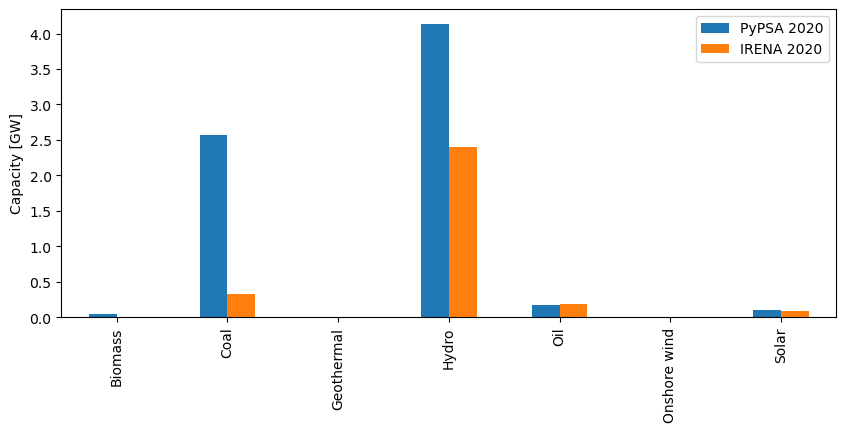

In [32]:
world_ic = installed_capacity_irena.groupby("carrier").sum() / 1000
world_ic = world_ic.rename(index={"bioenergy": "Biomass"})

world_ic.index = world_ic.index.str.capitalize()

world_pypsa = installed_capacity.groupby("carrier").sum() / 1000
if "load" in world_pypsa.index:
    world_pypsa = world_pypsa.drop("load")
world_pypsa.index = world_pypsa.index.str.capitalize()

world_compare = pd.concat(
    [world_pypsa.rename("PyPSA 2020"), world_ic.rename("IRENA 2020")], axis=1
)

# Sorting and dropping
#world_compare = world_compare.drop("Waste")
#world_compare = world_compare.drop("Other")
world_compare = world_compare.sort_index()

# Plot
ax = world_compare.plot.bar(
    ylabel="Capacity [GW]", xlabel="Technology", figsize=(10, 4)
).set(xlabel=None)
#plt.savefig("capacity-validation-all.pdf", bbox_inches="tight")

[Text(0.5, 0, '')]

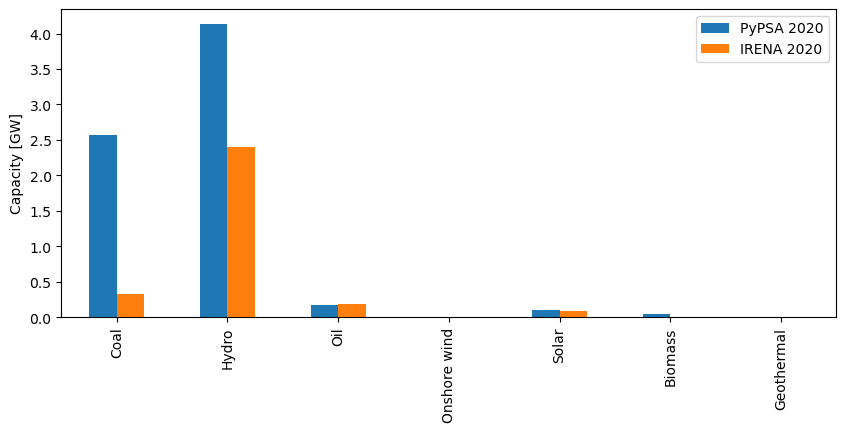

In [33]:
list_carriers = [
    "Coal",
    "Hydro",
    "Oil",
    "Onshore wind",
    "Solar",
    "Biomass",
    "Geothermal"
    
]

world_compare.loc[list_carriers].plot.bar(
    ylabel="Capacity [GW]", xlabel="Technology", figsize=(10, 4)
).set(xlabel=None)

# plt.savefig("capacity-validation.pdf", bbox_inches="tight")

#### Get data from usaid manually

### 

In [34]:
# Get data from usaid manually
usaid_ng = pd.DataFrame(
    data=[2.393,0.333, 0, 0.091,0.122],
    index=["Hydro", "coal", "Wind", "Solar", "Other/Diesel/HFO"],
    columns=["USAID"]
)

# Prepare data from usaid
usaid_ng.index.name = "carrier"

usaid_ng.rename(
    index={
        "Hydro": "hydro",
        "coal": "coal",
        "Wind": "wind",
        "Solar": "solar",
        "Other/Diesel/HFO": "oil"
    },
    inplace=True,
)
print("WARNING: Other/Diesel/HFO is renamed to 'Oil'")

In [35]:
country = "ZM"
country_ic = (
    installed_capacity_irena.iloc[
        installed_capacity_irena.index.get_level_values("alpha2") == country
    ]
    / 1000
)
country_pypsa = (
    installed_capacity.iloc[
        installed_capacity.index.get_level_values("alpha2") == country
    ]
    / 1000
)
country_compare = pd.concat(
    [country_pypsa.rename("PyPSA 2020"), country_ic.rename("IRENA 2020")], axis=1
)
country_compare.index = country_compare.index.get_level_values(1)
country_compare = pd.concat([country_compare, usaid_ng], axis=1)

#### Adjustng the dataframe

In [36]:
# Rename the index according to existing graph in paper
required_index = {
    "coal": "Coal",
    
    "hydro": "Hydro",
    "oil": "Oil",
    "wind": "Onshore wind",
    "solar": "Solar",
    # "Nuclear": "Nuclear",
    # "bioenergy": "Bioenergy",
    # "geothermal": "Geothermal",
}

country_compare.rename(index=required_index, inplace=True)

# select only required technologies
country_compare_sel = country_compare.loc[list(required_index.values())]

#### Plot the gragh

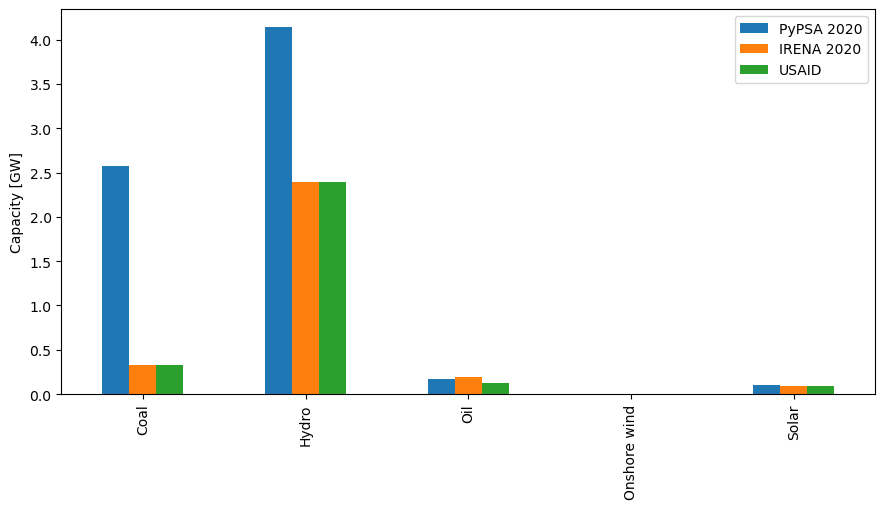

In [37]:
ax = country_compare_sel.plot.bar(ylabel="Capacity [GW]", xlabel="", figsize=(10.5, 5))
#optional:save it
ax.figure.savefig("capacity-validation-ng.pdf", bbox_inches="tight")

[Text(0.5, 0, '')]

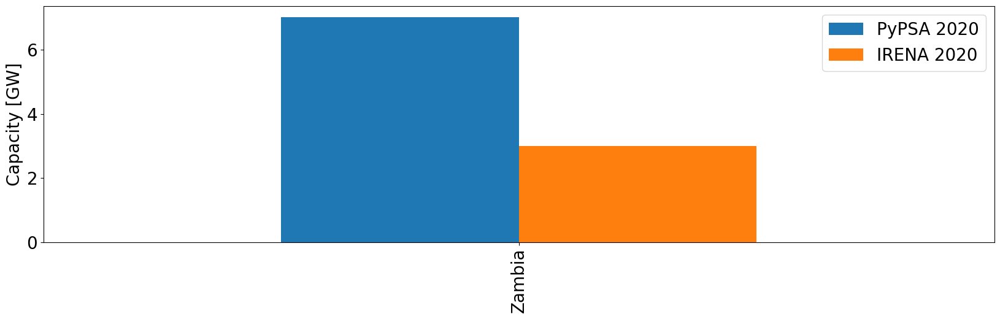

In [38]:
country_ic = (
    installed_capacity_irena[
        installed_capacity_irena.index.get_level_values(1)
        .str.capitalize()
        .isin(list_carriers)
    ]
    .groupby("alpha2")
    .sum()
    / 1000
)
country_pypsa = (
    installed_capacity[
        installed_capacity.index.get_level_values(1)
        .str.capitalize()
        .isin(list_carriers)
    ]
    .groupby("alpha2")
    .sum()
    / 1000
)

country_compare = pd.concat(
    [country_pypsa.rename("PyPSA 2020"), country_ic.rename("IRENA 2020")], axis=1
)
country_compare.index = pd.Series(
    country_compare.index.map(two_digits_2_name_country)
).replace(
    {
        "Congo, The Democratic Republic of the": "DRC",
        "Central African Republic": "CAR",
        "Tanzania, United Republic of": "Tanzania",
    }
)
plt.rcParams.update({"font.size": 20})
ax = country_compare.plot.bar(
    figsize=(20, 5), ylabel="Capacity [GW]", xlabel="Country", fontsize=20
)
ax.set(xlabel=None)

# plt.savefig("capacity-validation-by-country.pdf", bbox_inches="tight")

In [39]:
# Initialize the matplotlib figure
import seaborn as sns
import matplotlib.pyplot as plt

In [40]:
world_compare = world_compare.copy()
world_compare = world_compare.reset_index()

pypsa_values = world_compare.loc[:, ["carrier", "PyPSA 2020"]]
pypsa_values.loc[:, "sources"] = "PyPSA 2020"
pypsa_values.rename(columns={"PyPSA 2020": "capacity [GW]"}, inplace=True)

irena_values = world_compare.loc[:, ["carrier", "IRENA 2020"]]
irena_values.loc[:, "sources"] = "IRENA 2020"
irena_values.rename(columns={"IRENA 2020": "capacity [GW]"}, inplace=True)

seaborn_df = pd.concat([pypsa_values, irena_values])

In [41]:
pypsa_values.set_index("carrier")["capacity [GW]"] / irena_values.set_index("carrier")[
    "capacity [GW]"
]

carrier
Biomass              inf
Coal            7.787879
Geothermal           NaN
Hydro           1.726493
Oil             0.892632
Onshore wind         NaN
Solar           1.099381
Name: capacity [GW], dtype: float64

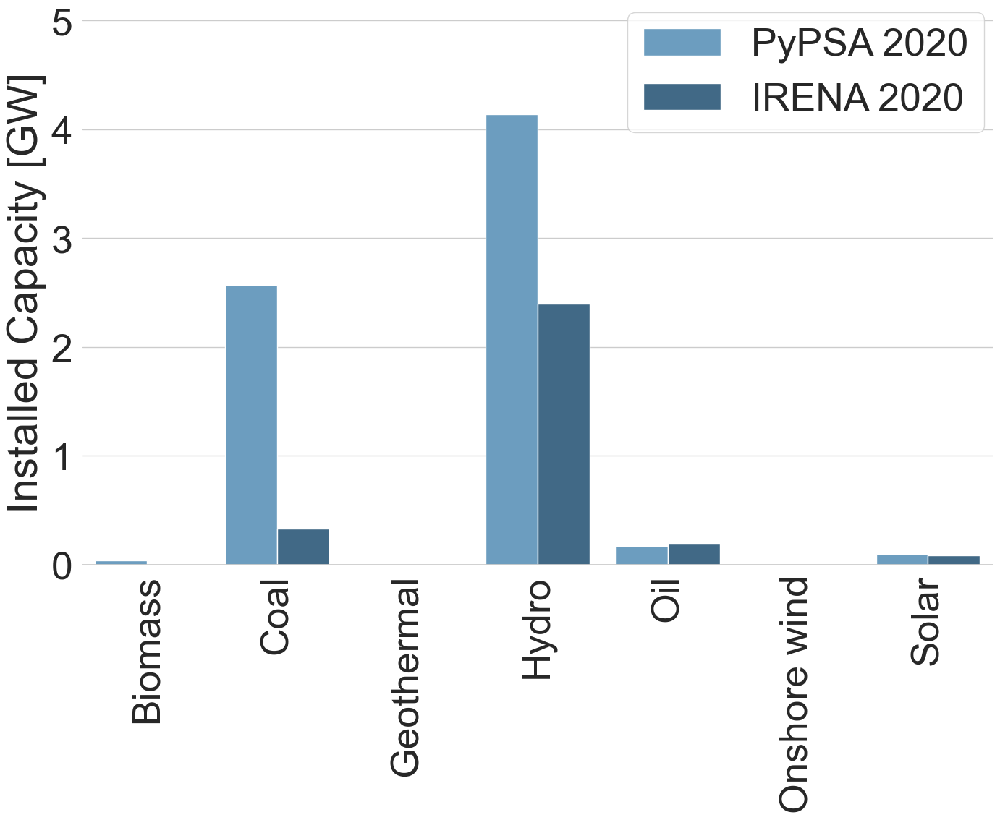

In [42]:
sns.set_theme(style="whitegrid", font_scale=3.5)

ax = sns.catplot(
    x="carrier",
    y="capacity [GW]",
    hue="sources",
    data=seaborn_df,
    palette="Blues_d",
    kind="bar",
    height=10,
    aspect=1.5,
)

ax.set_xticklabels(rotation=90)
sns.move_legend(
    ax, "upper right", bbox_to_anchor=(0.75, 0.975), frameon=True, title=None
)
sns.despine(left=True, bottom=False)
ax.set(xlabel=None, ylabel="Installed Capacity [GW]", ylim=(0, 5))

# plt.savefig("capacity-validation-all.pdf", bbox_inches="tight")

In [43]:
country_compare_sel = country_compare_sel.copy()
country_compare_sel = country_compare_sel.reset_index()

pypsa_values = country_compare_sel.loc[:, ["carrier", "PyPSA 2020"]]
pypsa_values.loc[:, "sources"] = "PyPSA 2020"
pypsa_values.rename(columns={"PyPSA 2020": "capacity [GW]"}, inplace=True)

irena_values = country_compare_sel.loc[:, ["carrier", "IRENA 2020"]]
irena_values.loc[:, "sources"] = "IRENA 2020"
irena_values.rename(columns={"IRENA 2020": "capacity [GW]"}, inplace=True)

usaid_values = country_compare_sel.loc[:, ["carrier", "USAID"]]
usaid_values.loc[:, "sources"] = "USAID 2020"
usaid_values.rename(columns={"USAID": "capacity [GW]"}, inplace=True)

seaborn_df = pd.concat([pypsa_values, irena_values, usaid_values])

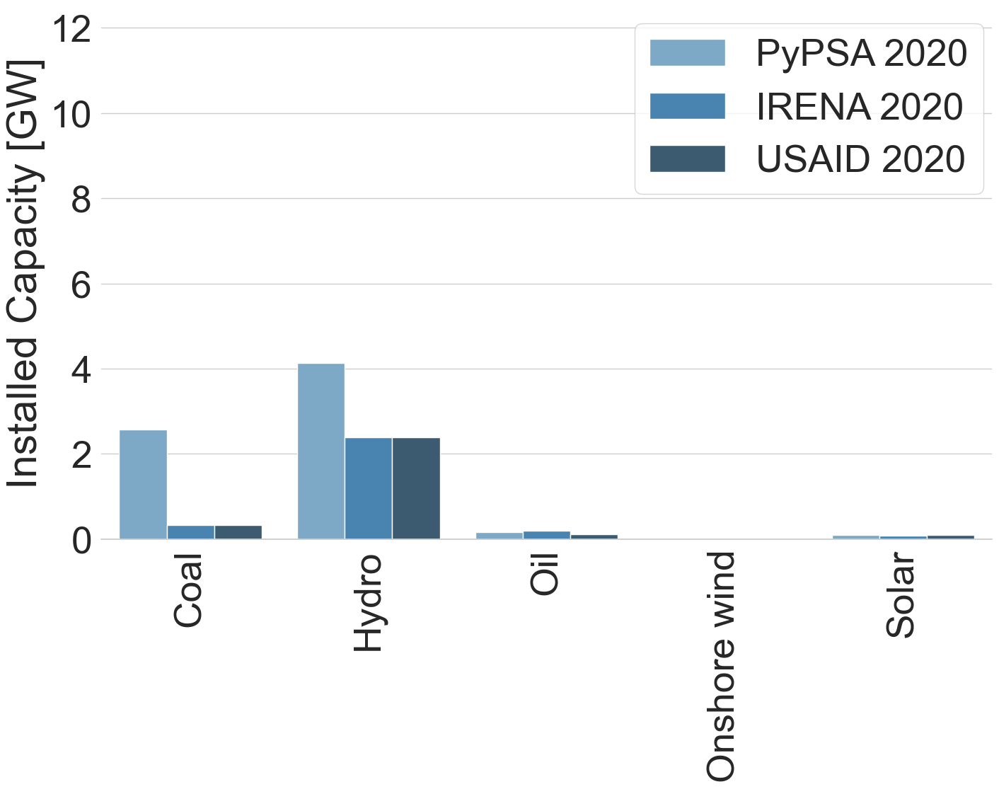

In [44]:
sns.set_theme(style="whitegrid", font_scale=3.5)

ax = sns.catplot(
    x="carrier",
    y="capacity [GW]",
    hue="sources",
    data=seaborn_df,
    palette="Blues_d",
    kind="bar",
    height=10,
    aspect=1.5,
)

ax.set_xticklabels(rotation=90)
sns.move_legend(
    ax, "upper right", bbox_to_anchor=(0.75, 0.94), frameon=True, title=None
)
sns.despine(left=True, bottom=False)
ax.set(xlabel=None, ylabel="Installed Capacity [GW]", ylim=(0, 12.5))

# plt.savefig("capacity-validation-ng.pdf", bbox_inches="tight")

In [46]:
country_compare = country_compare.copy()
country_compare = country_compare.reset_index()

pypsa_values = country_compare.loc[:, ["alpha2", "PyPSA 2020"]]
pypsa_values.loc[:, "sources"] = "PyPSA 2020"
pypsa_values.rename(columns={"PyPSA 2020": "capacity [GW]"}, inplace=True)

irena_values = country_compare.loc[:, ["alpha2", "IRENA 2020"]]
irena_values.loc[:, "sources"] = "IRENA 2020"
irena_values.rename(columns={"IRENA 2020": "capacity [GW]"}, inplace=True)

seaborn_df = pd.concat([pypsa_values, irena_values])

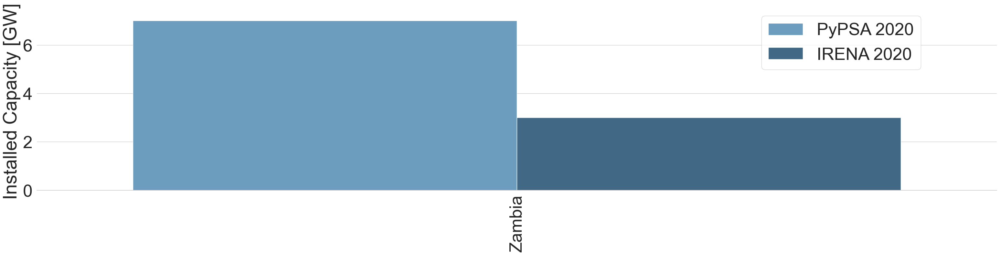

In [47]:
sns.set_theme(style="whitegrid", font_scale=3.5)

ax = sns.catplot(
    x="alpha2",
    y="capacity [GW]",
    hue="sources",
    data=seaborn_df,
    palette="Blues_d",
    kind="bar",
    height=8,
    aspect=4,
)

ax.set_xticklabels(rotation=90)
sns.move_legend(ax, "upper right", bbox_to_anchor=(0.8, 0.94), frameon=True, title=None)
sns.despine(left=True, bottom=False)
ax.set(xlabel=None, ylabel="Installed Capacity [GW]")

# plt.savefig("capacity-validation-by-country.pdf", bbox_inches="tight")